In [2]:
import pandas as pd
import numpy as np
import plotly.express as px
import seaborn as sns
%matplotlib inline

from scipy.stats import zscore

pd.set_option("display.max_rows",None)
pd.set_option("display.max_columns",None)

from sklearn.preprocessing import StandardScaler


In [3]:
##let's read csv file and show the file of data
def read_show():
    global data
    data=pd.read_csv(input("Enter the URL"))
    # read the csv file in jupyter notebook
    return data.head()# return 5 row of dataset

In [4]:
read_show()

Enter the URLC:\Users\sunil\Desktop\ML project\e-com\online_shoppers_intention.csv


,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


In [5]:
def data_understand(data):
    print("\n","Name of the columns",data.columns)
    #lets check out the name of collumns
    print("\n","size of the detaset",data.shape)
      #lets check out the no. of size of detaset
    print("\n","understaning the detaset information",data.info())
      # understanding info
    return data.isnull().sum()
       # lets check missing values in dataset

In [6]:
data_understand(data)


 Name of the columns Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay', 'Month',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'VisitorType',
       'Weekend', 'Revenue'],
      dtype='object')

 size of the detaset (12330, 18)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64


Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
OperatingSystems           0
Browser                    0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
Revenue                    0
dtype: int64

In [7]:
#Exploring dataset to findout which type of missing values are present
data.loc[7:100]

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
7,1,0.000000,0,0.0,0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1,2,1,5,Returning_Visitor,True,False
8,0,0.000000,0,0.0,2,37.000000,0.000000,0.100000,0.000000,0.8,Feb,2,2,2,3,Returning_Visitor,False,False
9,0,0.000000,0,0.0,3,738.000000,0.000000,0.022222,0.000000,0.4,Feb,2,4,1,2,Returning_Visitor,False,False
10,0,0.000000,0,0.0,3,395.000000,0.000000,0.066667,0.000000,0.0,Feb,1,1,3,3,Returning_Visitor,False,False
11,0,0.000000,0,0.0,16,407.750000,0.018750,0.025833,0.000000,0.4,Feb,1,1,4,3,Returning_Visitor,False,False
12,0,0.000000,0,0.0,7,280.500000,0.000000,0.028571,0.000000,0.0,Feb,1,1,1,3,Returning_Visitor,False,False
13,0,0.000000,0,0.0,6,98.000000,0.000000,0.066667,0.000000,0.0,Feb,2,5,1,3,Returning_Visitor,False,False
14,0,0.000000,0,0.0,2,68.000000,0.000000,0.100000,0.000000,0.0,Feb,3,2,3,3,Returning_Visitor,False,False
15,2,53.000000,0,0.0,23,1668.285119,0.008333,0.016313,0.000000,0.0,Feb,1,1,9,3,Returning_Visitor,False,False
16,0,0.000000,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1,1,4,3,Returning_Visitor,False,False


In [8]:
#copy orignal data into anathor name
import copy
df_copy=copy.deepcopy(data)

In [9]:
#finding which type of unique values have present

df_copy['Month'].unique()

array(['Feb', 'Mar', 'May', 'Oct', 'June', 'Jul', 'Aug', 'Nov', 'Sep',
       'Dec'], dtype=object)

In [10]:
df_copy['VisitorType'].unique()

array(['Returning_Visitor', 'New_Visitor', 'Other'], dtype=object)

In [11]:
df_copy.shape

(12330, 18)

In [12]:
##convert non numeric to numeric
from sklearn.preprocessing import LabelEncoder

df_copy.loc[:,['Month', 'VisitorType', 'Weekend','Revenue']] = df_copy.loc[:,['Month', 'VisitorType', 'Weekend','Revenue']].apply(LabelEncoder().fit_transform) 


In [13]:
df_copy.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,2,1,1,1,1,2,0,0
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,2,2,2,1,2,2,0,0
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,2,4,1,9,3,2,0,0
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,2,3,2,2,4,2,0,0
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,2,3,3,1,4,2,1,0


In [14]:
# go for discriptive statestics
df_copy.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Administrative,12330.0,2.315166,3.321784,0.0,0.000000,1.000000,4.000000,27.000000
Administrative_Duration,12330.0,80.818611,176.779107,0.0,0.000000,7.500000,93.256250,3398.750000
Informational,12330.0,0.503569,1.270156,0.0,0.000000,0.000000,0.000000,24.000000
Informational_Duration,12330.0,34.472398,140.749294,0.0,0.000000,0.000000,0.000000,2549.375000
ProductRelated,12330.0,31.731468,44.475503,0.0,7.000000,18.000000,38.000000,705.000000
ProductRelated_Duration,12330.0,1194.746220,1913.669288,0.0,184.137500,598.936905,1464.157214,63973.522230
BounceRates,12330.0,0.022191,0.048488,0.0,0.000000,0.003112,0.016813,0.200000
ExitRates,12330.0,0.043073,0.048597,0.0,0.014286,0.025156,0.050000,0.200000
PageValues,12330.0,5.889258,18.568437,0.0,0.000000,0.000000,0.000000,361.763742
SpecialDay,12330.0,0.061427,0.198917,0.0,0.000000,0.000000,0.000000,1.000000


In [15]:
# working on outlier
df_copy.skew()

Administrative             1.960357
Administrative_Duration    5.615719
Informational              4.036464
Informational_Duration     7.579185
ProductRelated             4.341516
ProductRelated_Duration    7.263228
BounceRates                2.947855
ExitRates                  2.148789
PageValues                 6.382964
SpecialDay                 3.302667
Month                     -0.832535
OperatingSystems           2.066285
Browser                    3.242350
Region                     0.983549
TrafficType                1.962987
VisitorType               -2.065135
Weekend                    1.265962
Revenue                    1.909509
dtype: float64

### data are skewd

In [16]:
df_copy.kurtosis()

Administrative               4.701146
Administrative_Duration     50.556739
Informational               26.932266
Informational_Duration      76.316853
ProductRelated              31.211707
ProductRelated_Duration    137.174164
BounceRates                  7.723159
ExitRates                    4.017035
PageValues                  65.635694
SpecialDay                   9.913659
Month                       -0.368330
OperatingSystems            10.456843
Browser                     12.746733
Region                      -0.148680
TrafficType                  3.479711
VisitorType                  2.295013
Weekend                     -0.397404
Revenue                      1.646493
dtype: float64

### kurtosis are present

In [17]:
# finding outlier using box-plot technique
for i in df_copy.columns:
    fig = px.box(df_copy, y=i, width=600, height=400, title=i , template="plotly_dark")
    fig.show()

In [18]:
# Treatment on extream values using zscore
def multi_tretment_outlier(df_copy):   
    global data_z
    print("List of outliers")
    data_z= df_copy.apply(zscore) # find outlier using zscore 
    print(np.where(data_z > 3))
    feature_columns = df_copy.columns

    for i in feature_columns:   #tretment of outliers
        df_copy[i] = np.where(df_copy[i] > (df_copy[i].quantile(0.75) + (df_copy[i].quantile(0.75) - df_copy[i].quantile(0.25))*1.5),
                           (df_copy[i].quantile(0.75) + (df_copy[i].quantile(0.75) - df_copy[i].quantile(0.25))*1.5),
                          np.where(df_copy[i] < (df_copy[i].quantile(0.25) - (df_copy[i].quantile(0.75) - df_copy[i].quantile(0.25))*1.5),
                           (df_copy[i].quantile(0.25) - (df_copy[i].quantile(0.75) - df_copy[i].quantile(0.25))*1.5),df_copy[i]))
    for i in feature_columns:
        fig = px.box(df_copy , y= i, width=600, height=400, title=i, template="plotly_dark") 

        fig.show() 
    global data_z_1
    print(" Resolve outliers") 
    data_z_1= df_copy.apply(zscore)
    print(np.where(data_z_1 > 18)) ## treatment on extream value using z_score



In [19]:
multi_tretment_outlier(df_copy)

List of outliers
(array([    0,     0,     2, ..., 12321, 12321, 12321], dtype=int64), array([ 6,  7,  6, ...,  6,  7, 12], dtype=int64))


 Resolve outliers
(array([], dtype=int64), array([], dtype=int64))


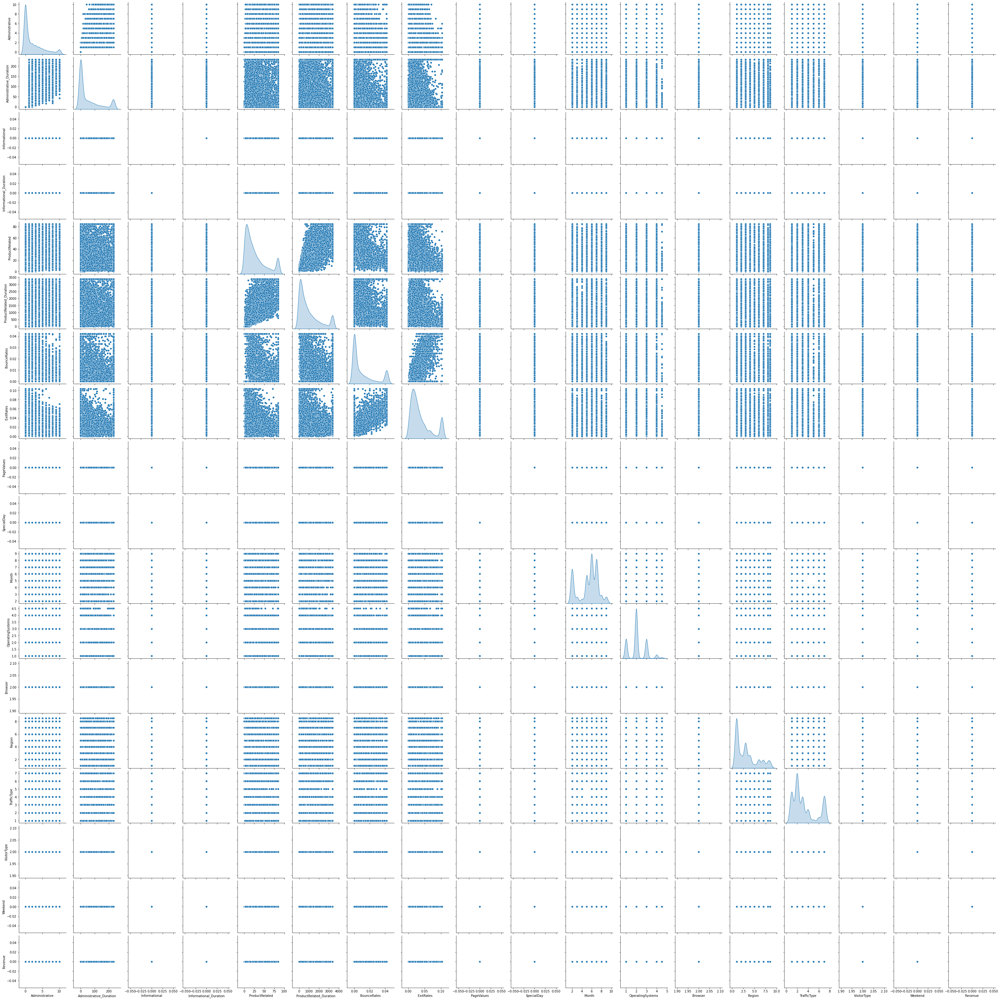

In [20]:
sns.pairplot(df_copy, diag_kind = "kde")

<AxesSubplot:>

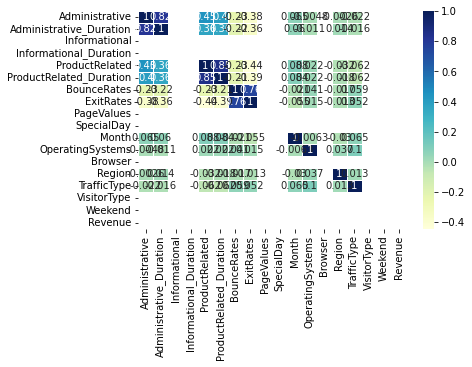

In [21]:
sns.heatmap(df_copy.corr(method = "pearson"), annot = True, cmap="YlGnBu", linewidths=.5)

## some feature show the high negative correlation

In [22]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler

In [23]:
#scale dataset using StandardScaler method
scale_1 = StandardScaler()
train_scale = scale_1.fit_transform(df_copy)

In [24]:
train_scale[:5]

array([[-0.75184584, -0.71892194,  0.        ,  0.        , -1.02151789,
        -0.95800238,  2.09099881,  2.19976889,  0.        ,  0.        ,
        -1.69524807, -1.39545325,  0.        , -0.90396852, -1.0640987 ,
         0.        ,  0.        ,  0.        ],
       [-0.75184584, -0.71892194,  0.        ,  0.        , -0.98176428,
        -0.8960516 , -0.73473346,  2.0827199 ,  0.        ,  0.        ,
        -1.69524807, -0.12409414,  0.        , -0.90396852, -0.58402783,
         0.        ,  0.        ,  0.        ],
       [-0.75184584, -0.71892194,  0.        ,  0.        , -1.02151789,
        -0.95800238,  2.09099881,  2.19976889,  0.        ,  0.        ,
        -1.69524807,  2.4186241 ,  0.        ,  2.28404472, -0.10395695,
         0.        ,  0.        ,  0.        ],
       [-0.75184584, -0.71892194,  0.        ,  0.        , -0.98176428,
        -0.9554211 ,  2.09099881,  2.19976889,  0.        ,  0.        ,
        -1.69524807,  1.14726498,  0.        , -0.478

### dimention reduction

In [25]:
from sklearn.decomposition import PCA

In [26]:
# Reduce dimention using dimention technique
def dim_fn(train_scale, method):
    global train_dim
        
        
    reduce = method
    train_dim = reduce.fit_transform(train_scale)
    
    
    var_train = np.var(train_dim, axis = 0)
    var_train_ratio = var_train / np.sum(var_train)
    
    
    
    print("varance ratio for train : ", var_train_ratio)

    

    
    return

In [27]:
dim_fn(train_scale, PCA(n_components = 4))

varance ratio for train :  [0.48146673 0.18950325 0.166958   0.16207202]


In [28]:
from sklearn.decomposition import FactorAnalysis

In [29]:
dim_fn(train_scale, FactorAnalysis(n_components = 4))

varance ratio for train :  [0.29914582 0.28898208 0.25808474 0.15378736]


In [30]:
from sklearn.decomposition import KernelPCA

In [31]:
dim_fn(train_scale, KernelPCA(n_components = 4, kernel = 'rbf'))

varance ratio for train :  [0.37167375 0.28562346 0.17158213 0.17112066]


In [32]:
dim_fn(train_scale, KernelPCA(n_components = 4, kernel = 'polynomial'))

varance ratio for train :  [0.46664511 0.23428113 0.1550406  0.14403316]


In [33]:
dim_fn(train_scale, KernelPCA(n_components = 4, kernel = 'sigmoid'))

varance ratio for train :  [0.48885254 0.18240123 0.1686468  0.16009943]


## clustering

In [34]:
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score


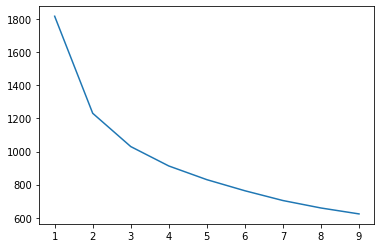

In [35]:
# doing clustering use KMeans clustering method ilbo_method
wss = []

for i in range(1,10):
    KM = KMeans(n_clusters = i)
    KM.fit(train_dim)
    wss.append(KM.inertia_)

plt.plot(range(1,10), wss)

In [36]:
# clustering using silhouett score
for i in range(2,10):
    k_means = KMeans(n_clusters = i, random_state = 15)
    k_means.fit(train_dim)
    labels = k_means.labels_
    print("Silhouette Score for ", i, " Clusters Solutions : ", silhouette_score(train_dim, labels))

Silhouette Score for  2  Clusters Solutions :  0.27601639167372266
Silhouette Score for  3  Clusters Solutions :  0.22089542902635761
Silhouette Score for  4  Clusters Solutions :  0.20878465012364017
Silhouette Score for  5  Clusters Solutions :  0.20237799361669923
Silhouette Score for  6  Clusters Solutions :  0.19414603075255302
Silhouette Score for  7  Clusters Solutions :  0.1944436104499032
Silhouette Score for  8  Clusters Solutions :  0.19426957032900707
Silhouette Score for  9  Clusters Solutions :  0.1941956347050781


## cluster 2 show the better score

In [38]:
k_means_final = KMeans(n_clusters = 2, random_state = 98)
k_means_final.fit(train_dim)
labels_4 = k_means_final.labels_

In [39]:
labels_4[:5]

array([0, 0, 0, 0, 0])

In [40]:
train_cluster_kmeans = copy.deepcopy(df_copy)

train_cluster_kmeans['Label'] = labels_4

In [41]:
train_cluster_kmeans.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Label
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.042031,0.103571,0.0,0.0,2.0,1.0,2.0,1.0,1.0,2.0,0.0,0.0,0
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.0,0.0,2.0,2.0,2.0,1.0,2.0,2.0,0.0,0.0,0
2,0.0,0.0,0.0,0.0,1.0,0.000000,0.042031,0.103571,0.0,0.0,2.0,4.0,2.0,8.5,3.0,2.0,0.0,0.0,0
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.042031,0.103571,0.0,0.0,2.0,3.0,2.0,2.0,4.0,2.0,0.0,0.0,0
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.0,0.0,2.0,3.0,2.0,1.0,4.0,2.0,0.0,0.0,0


In [42]:
train_cluster_kmeans.groupby('Label').mean()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
Label,,,,,,,,,,,,,,,,,,
0,0.541492,12.549136,0.0,0.0,12.090056,416.374291,0.015597,0.050725,0.0,0.0,5.159763,2.099654,2.0,3.155650,3.337711,2.0,0.0,0.0
1,4.324940,113.964334,0.0,0.0,45.434642,1725.206104,0.004940,0.018140,0.0,0.0,5.649509,2.094982,2.0,3.089428,3.061100,2.0,0.0,0.0


In [43]:
k_means_3 = KMeans(n_clusters = 2, random_state = 98)
k_means_3.fit(train_dim)
labels_3 = k_means_3.labels_

train_cluster_kmeans['Label_3'] = labels_3

train_cluster_kmeans.groupby('Label_3').mean()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Label
Label_3,,,,,,,,,,,,,,,,,,,
0,0.541492,12.549136,0.0,0.0,12.090056,416.374291,0.015597,0.050725,0.0,0.0,5.159763,2.099654,2.0,3.155650,3.337711,2.0,0.0,0.0,0
1,4.324940,113.964334,0.0,0.0,45.434642,1725.206104,0.004940,0.018140,0.0,0.0,5.649509,2.094982,2.0,3.089428,3.061100,2.0,0.0,0.0,1


# DBSCAN

In [44]:
from sklearn.cluster import DBSCAN 

from sklearn.neighbors import NearestNeighbors

In [45]:

neigh = NearestNeighbors(n_neighbors=3)
nbrs = neigh.fit(train_dim)
distances, indices = nbrs.kneighbors(train_dim)




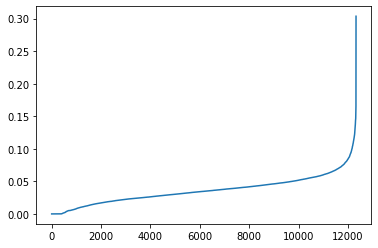

In [46]:
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [48]:
for i in range(8, 26):
    eps = i / 100
    dbscan = DBSCAN(eps = eps)
    model = dbscan.fit(train_dim)
    labels = model.labels_
    print(eps, '\t', silhouette_score(train_dim, labels))

0.08 	 -0.3228625100473922
0.09 	 -0.18179212633717604
0.1 	 0.05970306554066628
0.11 	 0.1931054593385504
0.12 	 0.19178979948700214
0.13 	 0.26388895890813047
0.14 	 0.2639010558365958
0.15 	 0.2801992408445043
0.16 	 0.28982925621357614
0.17 	 0.297784942148711
0.18 	 0.3273616359266776
0.19 	 0.36578851092876385
0.2 	 0.42071047093121916
0.21 	 0.42071047093121916
0.22 	 0.42071047093121916
0.23 	 0.42071047093121916
0.24 	 0.42071047093121916
0.25 	 0.42071047093121916


## 0.2 show the best eps silhouette score

In [49]:

dbscan = DBSCAN(eps = 0.2)

final_dbscan = dbscan.fit(train_dim)

db_labels = final_dbscan.labels_

In [50]:
train_cluster_kmeans['Label_DBSCAN'] = db_labels

train_cluster_kmeans.groupby('Label_DBSCAN').mean()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Label,Label_3
Label_DBSCAN,,,,,,,,,,,,,,,,,,,,
-1,0.000000,0.000000,0.0,0.0,84.50000,3384.186784,0.042031,0.066159,0.0,0.0,4.000000,4.500000,2.0,8.500000,5.0000,2.0,0.0,0.0,1.000000,1.000000
0,2.198962,56.977397,0.0,0.0,26.69154,989.497238,0.010926,0.036449,0.0,0.0,5.374402,2.097413,2.0,3.126207,3.2164,2.0,0.0,0.0,0.437992,0.437992


In [51]:
train_cluster_kmeans[train_cluster_kmeans['Label_DBSCAN'] == -1]

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Label,Label_3,Label_DBSCAN
5679,0.0,0.0,0.0,0.0,84.5,3384.186784,0.042031,0.066159,0.0,0.0,4.0,4.5,2.0,8.5,5.0,2.0,0.0,0.0,1,1,-1


In [52]:
data_anomaly = train_cluster_kmeans[train_cluster_kmeans['Label_DBSCAN'] == -1]
data_ok = train_cluster_kmeans[train_cluster_kmeans['Label_DBSCAN'] != -1]

In [53]:
data_ok.groupby('Label_3').mean()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Label,Label_DBSCAN
Label_3,,,,,,,,,,,,,,,,,,,,
0,0.541492,12.549136,0.0,0.0,12.090056,416.374291,0.015597,0.050725,0.0,0.0,5.159763,2.099654,2.0,3.155650,3.337711,2.0,0.0,0.0,0,0
1,4.325741,113.985438,0.0,0.0,45.427407,1724.898885,0.004933,0.018131,0.0,0.0,5.649815,2.094537,2.0,3.088426,3.060741,2.0,0.0,0.0,1,0


In [54]:
data_anomaly.groupby('Label_3').mean()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Label,Label_DBSCAN
Label_3,,,,,,,,,,,,,,,,,,,,
1,0.0,0.0,0.0,0.0,84.5,3384.186784,0.042031,0.066159,0.0,0.0,4.0,4.5,2.0,8.5,5.0,2.0,0.0,0.0,1,-1
